<a href="https://colab.research.google.com/github/sshk73/cap_siem_team-hk/blob/main/capstoneweek_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# upload csv file

from google.colab import files
uploaded = files.upload()



Saving file123.csv to file123.csv


In [2]:
# dataframe file123

import pandas as pd
import io

#  uploaded file is named 'file123.csv'
try:
  df = pd.read_csv(io.BytesIO(uploaded['file123.csv']))

except KeyError:
  print("Error: 'file123.csv' not found among uploaded files.")
except Exception as e:
  print(f"An error occurred: {e}")


In [3]:
df.head()

,No.,Time,Source,Destination,Protocol,Length,Info
0,1,0.000000,172.17.206.161,35.244.154.8,TCP,55,61944 > 443 [ACK] Seq=1 Ack=1 Win=255 Len=1
1,2,0.007161,35.244.154.8,172.17.206.161,TCP,66,443 > 61944 [ACK] Seq=1 Ack=2 Win=1045 Len=0...
2,3,0.062646,172.17.206.161,34.95.69.49,TCP,55,61962 > 443 [ACK] Seq=1 Ack=1 Win=251 Len=1
3,4,0.068552,34.95.69.49,172.17.206.161,TCP,66,443 > 61962 [ACK] Seq=1 Ack=2 Win=1042 Len=0...
4,5,3.660079,172.17.206.161,174.129.50.105,TCP,55,63259 > 443 [ACK] Seq=1 Ack=1 Win=252 Len=1 ...


In [4]:
df.shape

(550902, 7)

In [5]:
# Display data types of each column
df.dtypes


,0
No.,int64
Time,float64
Source,object
Destination,object
Protocol,object
Length,int64
Info,object


In [6]:
# print all the unique values in protocols

print(df['Protocol'].unique())


['TCP' 'TLSv1.2' 'ICMPv6' 'UDP' 'DNS' 'TLSv1.3' 'QUIC' 'NBNS' 'ICMP'
 'DHCP' 'IGMPv3' 'LLMNR' 'HTTP' 'OCSP' 'STUN' 'SSLv2' 'ARP' 'MDNS'
 'DTLSv1.2' 'NTP']


In [7]:
"""

### High Priority Protocols:
1. **TCP/UDP**: These are foundational transport protocols. Monitoring them helps detect unusual traffic patterns, port scanning, or DDoS attacks.
2. **DNS**: Critical for identifying domain-based threats, such as DNS tunneling or malicious domain queries.
3. **HTTP/HTTPS (TLSv1.2/TLSv1.3)**: Useful for detecting web-based threats, including phishing, malware downloads, or suspicious API calls.
4. **ICMP/ICMPv6**: Important for identifying network reconnaissance activities like ping sweeps or traceroute attempts.
5. **DHCP**: Helps track device connections and detect unauthorized devices on the network.
6. **ARP**: Useful for detecting ARP spoofing or man-in-the-middle attacks.

### Medium Priority Protocols:
1. **QUIC**: Emerging protocol used in modern web traffic; monitoring it can help detect anomalies in encrypted traffic.
2. **MDNS/LLMNR**: Useful for identifying local network threats, such as spoofing or unauthorized device discovery.
3. **NTP**: Helps detect time synchronization attacks or unusual time-based activity.

### Lower Priority Protocols:
1. **NBNS**: Legacy protocol; monitor only if your network uses it.
2. **IGMPv3**: Relevant for multicast traffic; monitor if multicast is critical in your environment.
3. **STUN/DTLSv1.2**: Useful for VoIP or WebRTC traffic; monitor if these are part of your infrastructure.
4. **SSLv2**: Deprecated; monitor only to identify legacy systems that need updates.

"""

'\n\n### High Priority Protocols:\n1. **TCP/UDP**: These are foundational transport protocols. Monitoring them helps detect unusual traffic patterns, port scanning, or DDoS attacks.\n2. **DNS**: Critical for identifying domain-based threats, such as DNS tunneling or malicious domain queries.\n3. **HTTP/HTTPS (TLSv1.2/TLSv1.3)**: Useful for detecting web-based threats, including phishing, malware downloads, or suspicious API calls.\n4. **ICMP/ICMPv6**: Important for identifying network reconnaissance activities like ping sweeps or traceroute attempts.\n5. **DHCP**: Helps track device connections and detect unauthorized devices on the network.\n6. **ARP**: Useful for detecting ARP spoofing or man-in-the-middle attacks.\n\n### Medium Priority Protocols:\n1. **QUIC**: Emerging protocol used in modern web traffic; monitoring it can help detect anomalies in encrypted traffic.\n2. **MDNS/LLMNR**: Useful for identifying local network threats, such as spoofing or unauthorized device discovery.\

In [8]:
df.dtypes

,0
No.,int64
Time,float64
Source,object
Destination,object
Protocol,object
Length,int64
Info,object


In [9]:
#  Check for missing values
print("Missing Values:\n", df.isnull().sum())

Missing Values:
 No.            0
Time           0
Source         0
Destination    0
Protocol       0
Length         0
Info           0
dtype: int64


Protocol Counts:
 Protocol
DTLSv1.2    229505
QUIC        213646
TCP          42821
STUN         37332
TLSv1.3      15409
TLSv1.2       6490
DNS           3305
UDP           1567
MDNS           254
ICMPv6         234
NBNS           136
ICMP           133
LLMNR           20
SSLv2           12
ARP             12
HTTP            12
OCSP             5
IGMPv3           5
DHCP             2
NTP              2
Name: count, dtype: int64


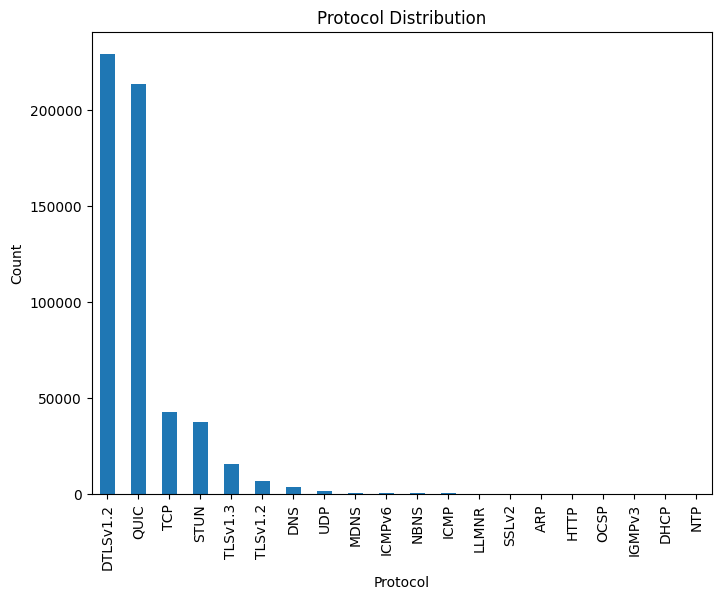

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

#  Protocol Distribution
protocol_counts = df['Protocol'].value_counts()
print("Protocol Counts:\n", protocol_counts)
protocol_counts.plot(kind='bar', figsize=(8, 6))
plt.title('Protocol Distribution')
plt.xlabel('Protocol')
plt.ylabel('Count')
plt.show()

In [11]:
# Source and Destination Analysis

top_sources = df['Source'].value_counts().head(10)
print("Top 10 Source IPs:\n", top_sources)
top_destinations = df['Destination'].value_counts().head(10)
print("Top 10 Destination IPs:\n", top_destinations)

Top 10 Source IPs:
 Source
172.17.206.161     336739
74.125.174.102      52464
89.217.3.58         20025
24.46.255.97        17449
173.194.191.103     12658
172.17.8.77          7326
185.111.172.151      6478
92.97.40.149         6208
101.127.27.6         5375
31.205.211.80        5289
Name: count, dtype: int64
Top 10 Destination IPs:
 Destination
172.17.206.161     213780
74.125.174.102     105071
89.217.3.58         37927
24.46.255.97        24208
173.194.191.103     17169
185.111.172.151     13460
151.83.161.230      10530
92.97.40.149         9114
172.17.8.77          8743
101.127.27.6         8732
Name: count, dtype: int64


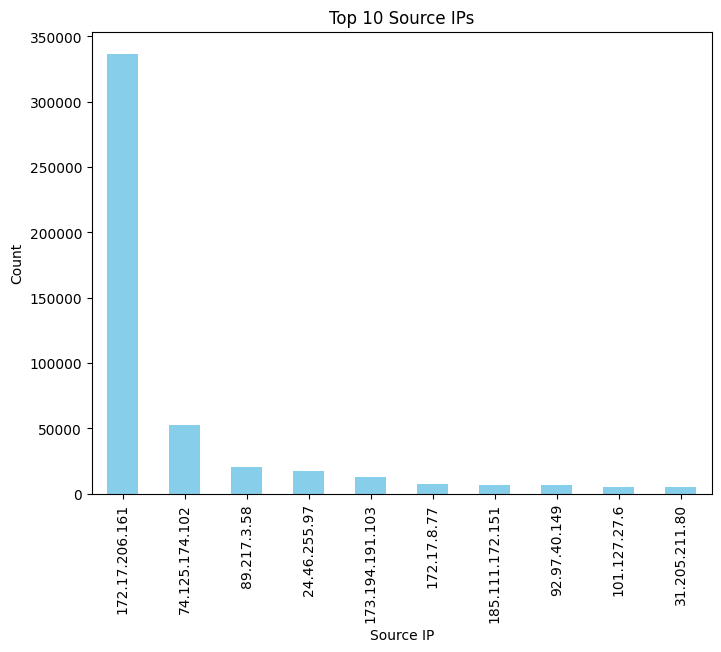

In [12]:
# Visualize top Source IPs

top_sources.plot(kind='bar', figsize=(8, 6), color='skyblue')
plt.title('Top 10 Source IPs')
plt.xlabel('Source IP')
plt.ylabel('Count')
plt.show()


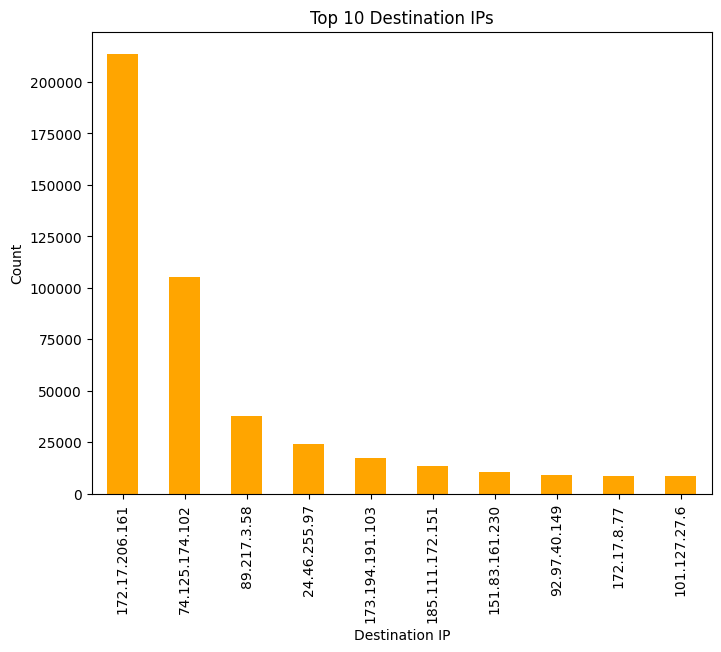

In [13]:
# Visualize top Destination IPs

top_destinations.plot(kind='bar', figsize=(8, 6), color='orange')
plt.title('Top 10 Destination IPs')
plt.xlabel('Destination IP')
plt.ylabel('Count')
plt.show()

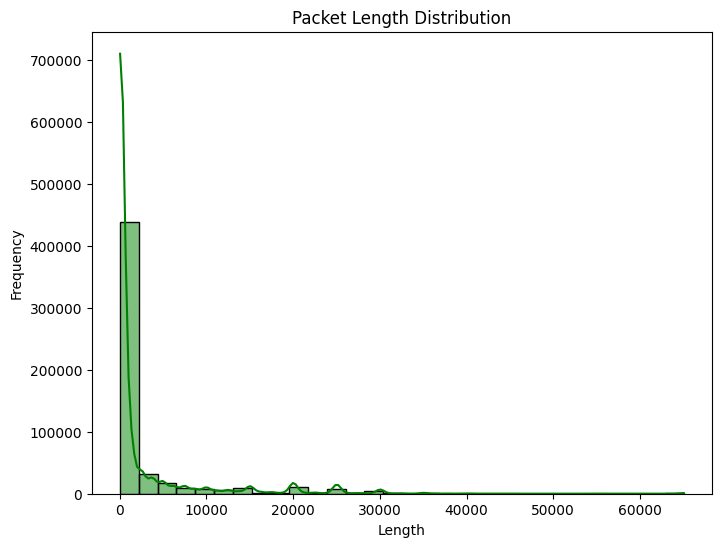

In [14]:
# Packet Length Analysis

plt.figure(figsize=(8, 6))
sns.histplot(df['Length'], kde=True, bins=30, color='green')
plt.title('Packet Length Distribution')
plt.xlabel('Length')
plt.ylabel('Frequency')
plt.show()

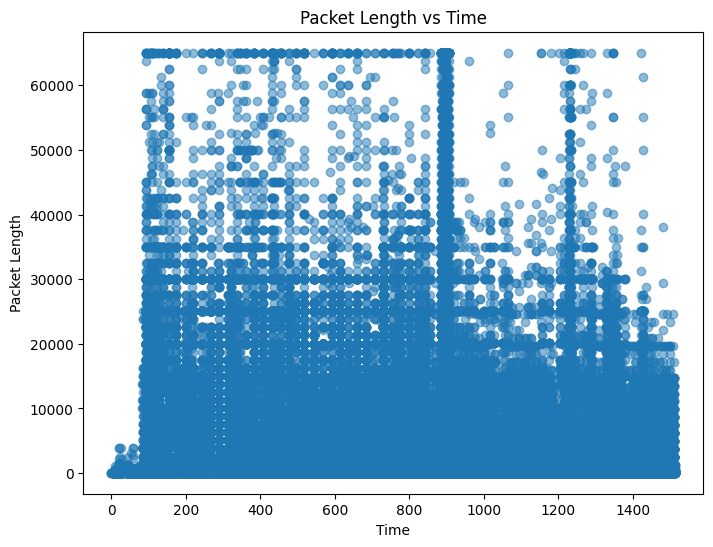

In [15]:
# 6. Time Analysis
plt.figure(figsize=(8, 6))
plt.plot(df['Time'], df['Length'], linestyle='', marker='o', alpha=0.5)
plt.title('Packet Length vs Time')
plt.xlabel('Time')
plt.ylabel('Packet Length')
plt.show()

In [16]:
# Time Analysis

# Adjust figure size and DPI for sharper resolution
plt.figure(figsize=(16, 8), dpi=1000)

# Plot with a more visually appealing color and marker size
plt.plot(df['Time'], df['Length'], linestyle='', marker='o', alpha=0.5, color='teal', markersize=4)

# Set title with larger font and bold style
plt.title('Packet Length vs Time', fontsize=16, fontweight='bold')

# Label axes with larger fonts
plt.xlabel('Time', fontsize=14)
plt.ylabel('Packet Length', fontsize=14)

# Add a grid for better visualization
plt.grid(True, linestyle='--', alpha=0.7)

# Set limits if needed to focus on specific ranges
plt.xlim(0, df['Time'].max())
plt.ylim(0, df['Length'].max())

# Show the optimized plot
plt.show()

In [17]:
# Extract Keywords from Info

info_keywords = df['Info'].str.extract(r'(\bACK\b|\bSYN\b)', expand=False)
print("Extracted Keywords:\n", info_keywords.value_counts())

Extracted Keywords:
 Info
ACK    39462
SYN     4231
Name: count, dtype: int64


In [18]:

"""
### FEATURE ENGINEERING:
1. Time_Diff: Measures intervals between packets to detect bursty traffic patterns.
2. Rolling Statistics: Adds features for windowed averages (`Rolling_Mean`) and extremes (`Rolling_Max/Min`) of packet lengths.
3. One-Hot Encoding: Encodes the `Protocol` column for better model compatibility.
4. Directionality: Categorizes packets as incoming or outgoing based on IP ranges.
5. Keywords Detection: Flags packets containing terms like "ACK" or "SYN" from the `Info` column.
6. Aggregations: Counts packets per `Source` and `Destination` IP to identify active communicators.
7. Graph Metrics: Uses `NetworkX` to analyze source-destination relationships with features like degree centrality.
8. Anomaly Flags: Marks packets with lengths beyond a statistical threshold.

"""


'\n### FEATURE ENGINEERING:\n1. Time_Diff: Measures intervals between packets to detect bursty traffic patterns.\n2. Rolling Statistics: Adds features for windowed averages (`Rolling_Mean`) and extremes (`Rolling_Max/Min`) of packet lengths.\n3. One-Hot Encoding: Encodes the `Protocol` column for better model compatibility.\n4. Directionality: Categorizes packets as incoming or outgoing based on IP ranges.\n5. Keywords Detection: Flags packets containing terms like "ACK" or "SYN" from the `Info` column.\n6. Aggregations: Counts packets per `Source` and `Destination` IP to identify active communicators.\n7. Graph Metrics: Uses `NetworkX` to analyze source-destination relationships with features like degree centrality.\n8. Anomaly Flags: Marks packets with lengths beyond a statistical threshold.\n\n'

In [19]:
# 1. Create Time Interval Feature

df['Time_Diff'] = df['Time'].diff().fillna(0)  # Time difference between consecutive packets

In [20]:

print(df[['Time_Diff','Time']].head(10))

   Time_Diff      Time
0   0.000000  0.000000
1   0.007161  0.007161
2   0.055485  0.062646
3   0.005906  0.068552
4   3.591527  3.660079
5   0.012676  3.672755
6   0.034910  3.707665
7   0.000027  3.707692
8   0.006012  3.713704
9   0.000000  3.713704


In [21]:
# 2. Rolling Statistics for Length

df['Length_Rolling_Mean'] = df['Length'].rolling(window=10).mean().fillna(df['Length'].mean())
df['Length_Rolling_Max'] = df['Length'].rolling(window=10).max().fillna(df['Length'].max())
df['Length_Rolling_Min'] = df['Length'].rolling(window=10).min().fillna(df['Length'].min())


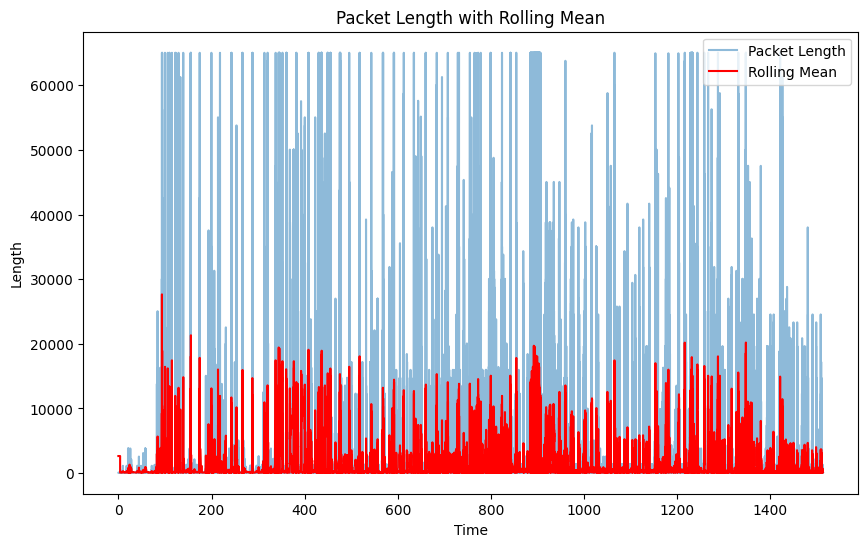

In [22]:
plt.figure(figsize=(10, 6))
plt.plot(df['Time'], df['Length'], label='Packet Length', alpha=0.5)
plt.plot(df['Time'], df['Length_Rolling_Mean'], label='Rolling Mean', color='red')
plt.title('Packet Length with Rolling Mean')
plt.xlabel('Time')
plt.ylabel('Length')
plt.legend()
plt.show()

In [23]:
# 3. One-Hot Encoding for Protocol

import numpy as np
import networkx as nx
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse_output=False) # Replace 'sparse' with 'sparse_output'
protocol_encoded = encoder.fit_transform(df[['Protocol']])
protocol_df = pd.DataFrame(protocol_encoded, columns=encoder.get_feature_names_out(['Protocol']))
df = pd.concat([df, protocol_df], axis=1)

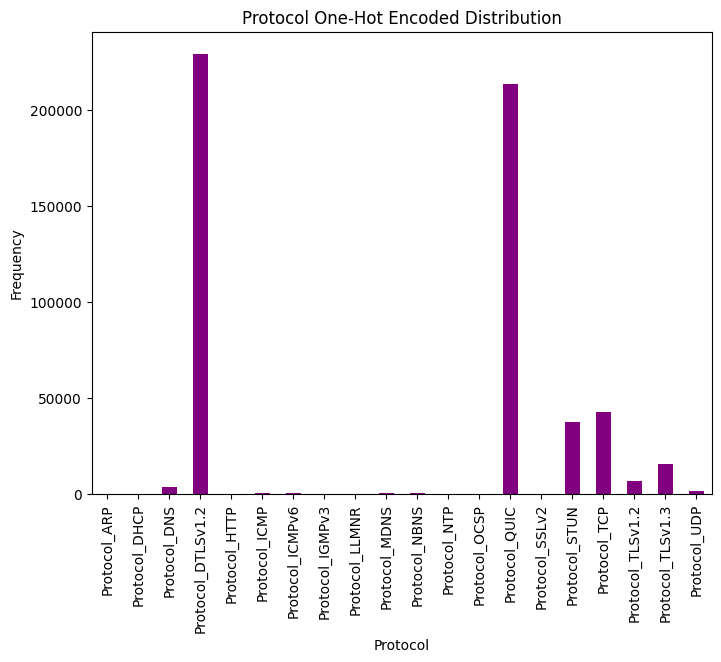

In [24]:
protocol_columns = [col for col in df.columns if col.startswith('Protocol_')]  # Add underscore to select one-hot encoded columns
df[protocol_columns].sum().plot(kind='bar', figsize=(8, 6), color='purple')
plt.title('Protocol One-Hot Encoded Distribution')
plt.xlabel('Protocol')
plt.ylabel('Frequency')
plt.show()

In [25]:
# 4. Packet Directionality Feature

# Assuming IP ranges: Internal = '172.17.x.x', External = others
df['Direction'] = np.where(df['Source'].str.startswith('172.17'), 'Outgoing', 'Incoming')

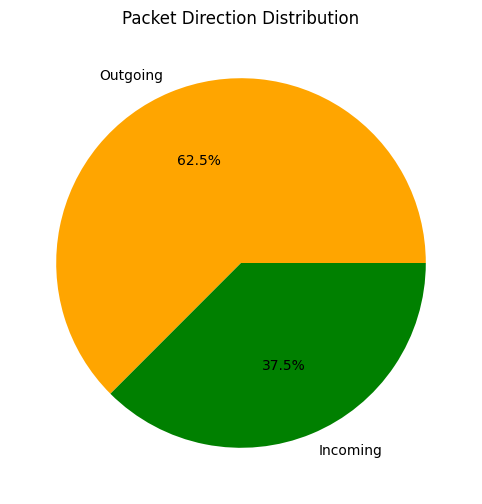

In [26]:
df['Direction'].value_counts().plot(kind='pie', autopct='%1.1f%%', figsize=(8, 6), colors=['orange', 'green'])
plt.title('Packet Direction Distribution')
plt.ylabel('')
plt.show()

In [27]:
# 5. Keywords from Info Column

df['Contains_ACK'] = df['Info'].str.contains('ACK').astype(int)
df['Contains_SYN'] = df['Info'].str.contains('SYN').astype(int)

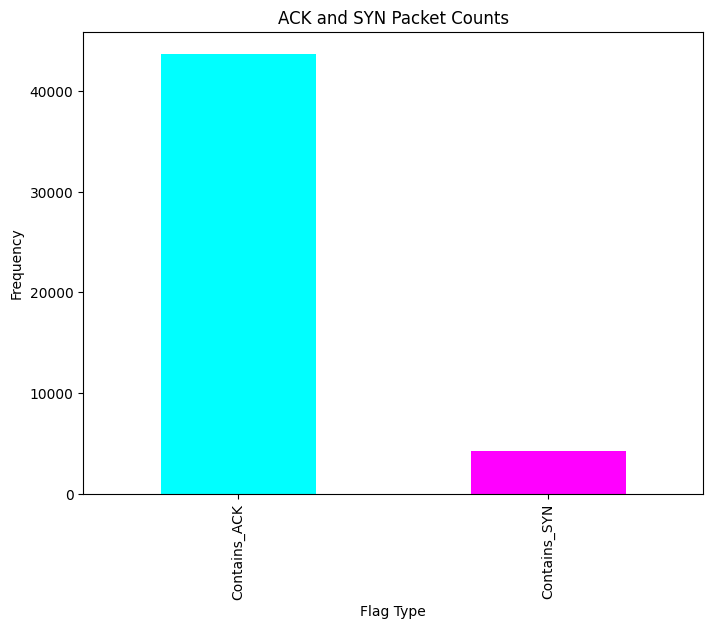

In [28]:
flag_counts = df[['Contains_ACK', 'Contains_SYN']].sum()
flag_counts.plot(kind='bar', color=['cyan', 'magenta'], figsize=(8, 6))
plt.title('ACK and SYN Packet Counts')
plt.xlabel('Flag Type')
plt.ylabel('Frequency')
plt.show()

In [29]:
# 6. Aggregate Features by Source/Destination

source_counts = df.groupby('Source').size()
destination_counts = df.groupby('Destination').size()
df['Source_Count'] = df['Source'].map(source_counts)
df['Destination_Count'] = df['Destination'].map(destination_counts)


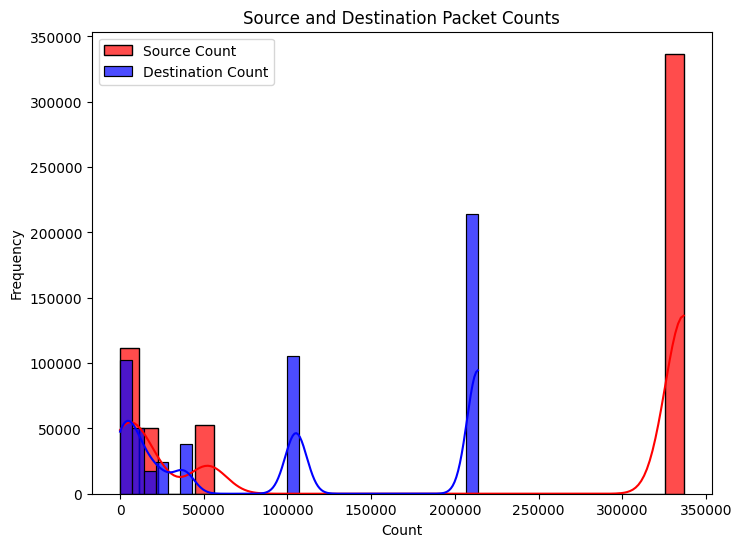

In [30]:
plt.figure(figsize=(8, 6))
sns.histplot(df['Source_Count'], bins=30, color='red', label='Source Count', kde=True, alpha=0.7)
sns.histplot(df['Destination_Count'], bins=30, color='blue', label='Destination Count', kde=True, alpha=0.7)
plt.title('Source and Destination Packet Counts')
plt.xlabel('Count')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [31]:

# 7. Network Graph Features

graph = nx.from_pandas_edgelist(df, source='Source', target='Destination')
df['Source_Degree'] = df['Source'].apply(lambda x: graph.degree(x))
df['Destination_Degree'] = df['Destination'].apply(lambda x: graph.degree(x))

In [32]:
print(df[['Source_Degree','Destination_Degree']].head(10))

   Source_Degree  Destination_Degree
0            498                   1
1              1                 498
2            498                   1
3              1                 498
4            498                   1
5              1                 498
6            498                   1
7            498                   1
8              1                 498
9              1                 498


In [33]:

# 8. Anomaly Flags

threshold = df['Length'].mean() + 2 * df['Length'].std()  # Threshold
df['Large_Packet'] = (df['Length'] > threshold).astype(int)

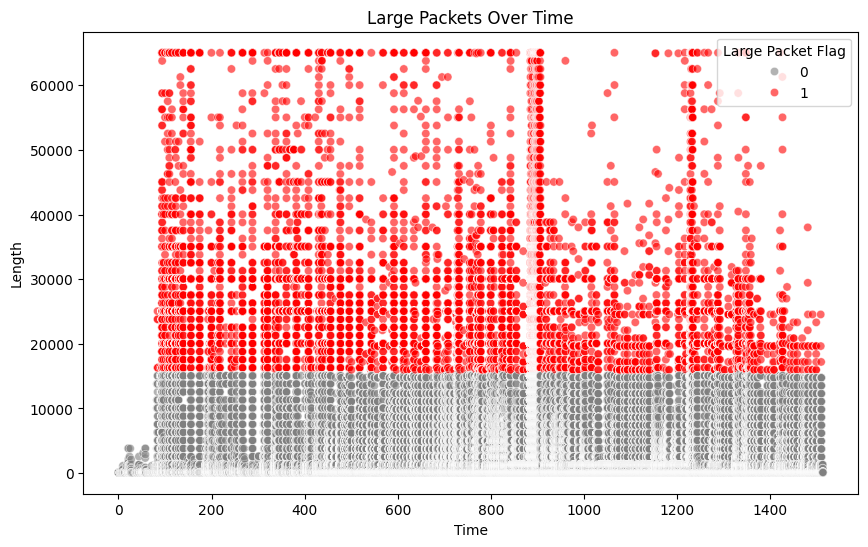

In [34]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Time', y='Length', hue='Large_Packet', data=df, palette={0: 'gray', 1: 'red'}, alpha=0.6)
plt.title('Large Packets Over Time')
plt.xlabel('Time')
plt.ylabel('Length')
plt.legend(title='Large Packet Flag', loc='upper right')
plt.show()

In [35]:
df.shape


(550902, 39)

In [36]:
df.columns

Index(['No.', 'Time', 'Source', 'Destination', 'Protocol', 'Length', 'Info',
       'Time_Diff', 'Length_Rolling_Mean', 'Length_Rolling_Max',
       'Length_Rolling_Min', 'Protocol_ARP', 'Protocol_DHCP', 'Protocol_DNS',
       'Protocol_DTLSv1.2', 'Protocol_HTTP', 'Protocol_ICMP',
       'Protocol_ICMPv6', 'Protocol_IGMPv3', 'Protocol_LLMNR', 'Protocol_MDNS',
       'Protocol_NBNS', 'Protocol_NTP', 'Protocol_OCSP', 'Protocol_QUIC',
       'Protocol_SSLv2', 'Protocol_STUN', 'Protocol_TCP', 'Protocol_TLSv1.2',
       'Protocol_TLSv1.3', 'Protocol_UDP', 'Direction', 'Contains_ACK',
       'Contains_SYN', 'Source_Count', 'Destination_Count', 'Source_Degree',
       'Destination_Degree', 'Large_Packet'],
      dtype='object')

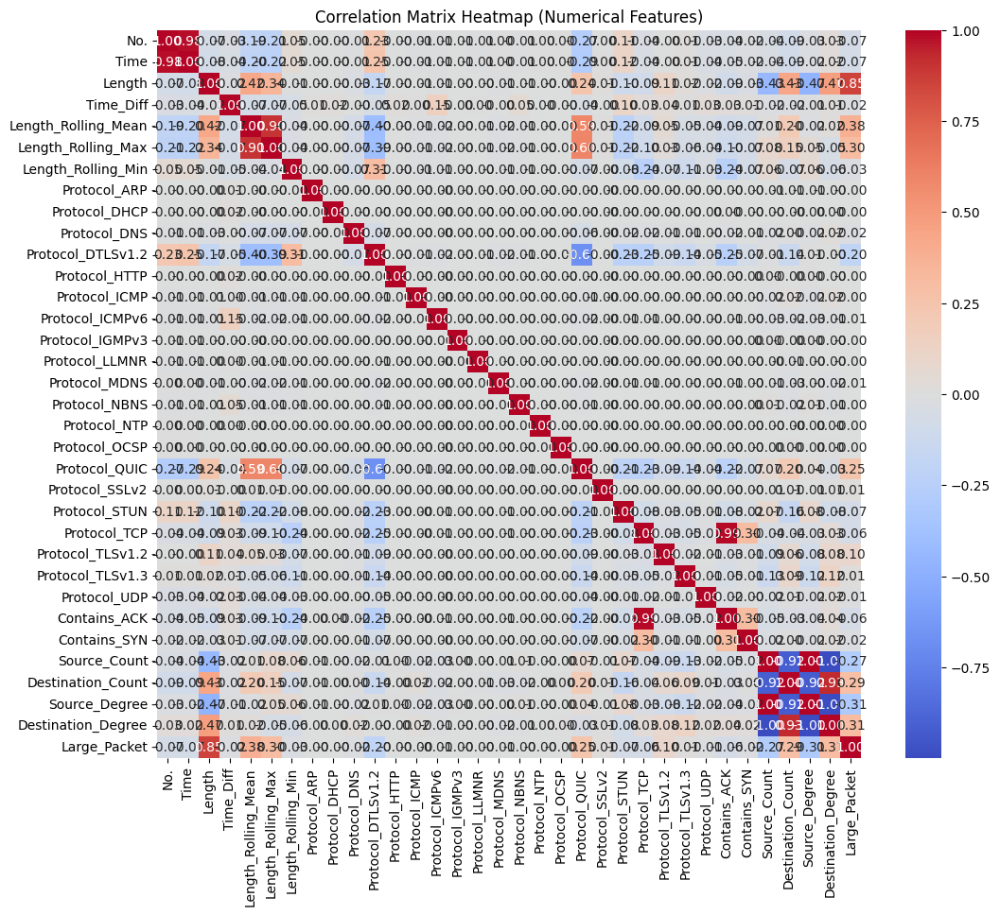

In [37]:
# corelation matrix heatmap of df with only numerical columns

import matplotlib.pyplot as plt
import numpy as np
# Assuming 'df' is your DataFrame from the previous code.

# Select only numerical columns
numerical_df = df.select_dtypes(include=np.number)

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap (Numerical Features)')
plt.show()

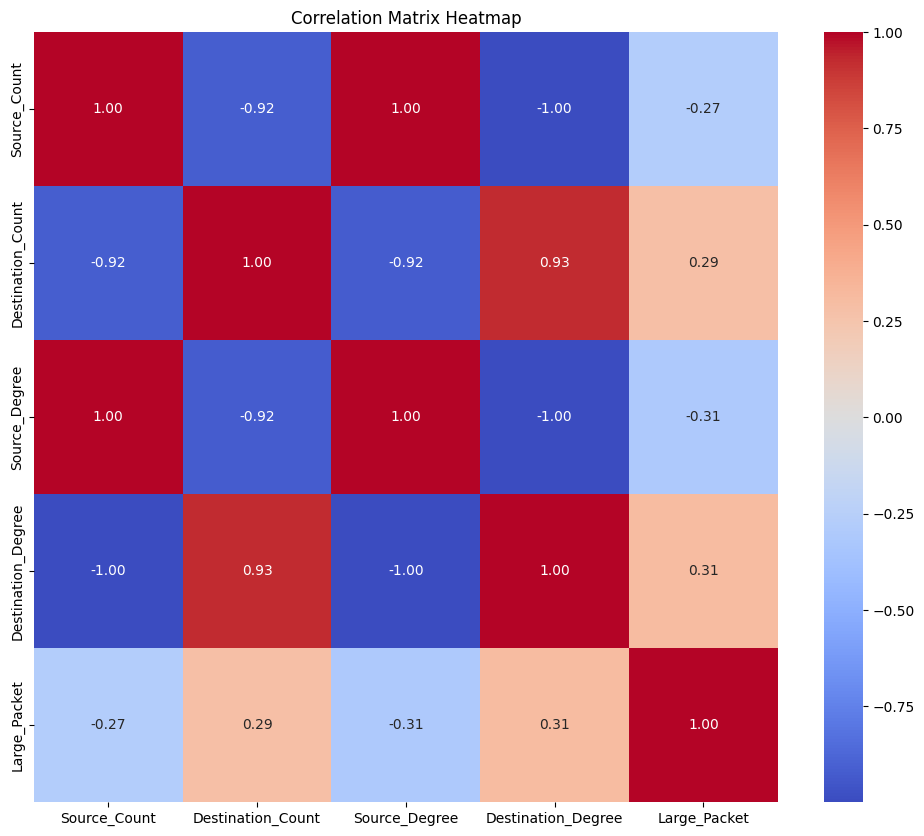

In [38]:
# coreation heat map of Source_count, Destination_count , Source_Degree, Destination_Degree, Large_Packet, Cluster

import matplotlib.pyplot as plt
import numpy as np
# Assuming 'df' is your DataFrame from the previous code.

# Select relevant columns for the correlation heatmap
columns_for_heatmap = ['Source_Count', 'Destination_Count', 'Source_Degree', 'Destination_Degree', 'Large_Packet']

# Check if 'Cluster' column exists, add if present
if 'Cluster' in df.columns:
  columns_for_heatmap.append('Cluster')

# Select only the specified columns and numerical data types
heatmap_df = df[columns_for_heatmap].select_dtypes(include=np.number)

# Calculate the correlation matrix
correlation_matrix = heatmap_df.corr()

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()


In [39]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# Select features and target (assuming `Large_Packet` is the target)
features = ['Time_Diff', 'Length_Rolling_Mean', 'Source_Count', 'Destination_Count', 'Source_Degree', 'Protocol_TCP', 'Protocol_UDP']  # Adjust based on your dataset
target = 'Large_Packet'

# Split into training and testing sets
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [40]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Initialize Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

Accuracy: 0.9588313774607237

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98    103771
           1       0.66      0.62      0.64      6410

    accuracy                           0.96    110181
   macro avg       0.82      0.80      0.81    110181
weighted avg       0.96      0.96      0.96    110181


Confusion Matrix:
 [[101699   2072]
 [  2464   3946]]


In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Train SVM model
svm_model = SVC(kernel='rbf', C=1, random_state=42)
svm_model.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred_svm = svm_model.predict(X_test_scaled)
print("SVM Accuracy:", accuracy_score(y_test, y_pred_svm))
print("\nSVM Classification Report:\n", classification_report(y_test, y_pred_svm))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_svm))

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBClassifier

# Train XGBoost model
xgb_model = XGBClassifier(n_estimators=100, max_depth=5, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred_xgb = xgb_model.predict(X_test_scaled)
print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("\nXGBoost Classification Report:\n", classification_report(y_test, y_pred_xgb))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_xgb))

In [ ]:
!pip install tensorflow


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import classification_report, accuracy_score

# Build the neural network
model = Sequential([
    Dense(50, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    Dense(30, activation='relu'),
    Dense(1, activation='sigmoid')  # Assuming binary classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_data=(X_test_scaled, y_test))

# Evaluate the model
y_pred_tf = (model.predict(X_test_scaled) > 0.5).astype(int)  # Threshold for binary predictions
print("TensorFlow Model Accuracy:", accuracy_score(y_test, y_pred_tf))
print("\nTensorFlow Model Classification Report:\n", classification_report(y_test, y_pred_tf))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_tf))

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler # Import StandardScaler

# Assuming 'X' contains the features you want to cluster
# You might need to adjust this based on your feature selection
X = df[['Time_Diff', 'Length_Rolling_Mean', 'Source_Count', 'Destination_Count', 'Source_Degree', 'Protocol_TCP', 'Protocol_UDP']]



# Scale the features using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # Create and assign X_scaled

# Train K-Means model
kmeans_model = KMeans(n_clusters=2, random_state=42)  # Adjust `n_clusters` as needed
kmeans_labels = kmeans_model.fit_predict(X_scaled)  # Use entire scaled data for clustering

# Add cluster labels to DataFrame
df['Cluster'] = kmeans_labels

# Analyze cluster distribution
print("Cluster Distribution:\n", df['Cluster'].value_counts())

# Visualize clusters (e.g., Length vs Time)
sns.scatterplot(x='Time', y='Length', hue='Cluster', data=df, palette='viridis', alpha=0.6)
plt.title('Clustered Data')
plt.xlabel('Time')
plt.ylabel('Length')
plt.legend(title='Cluster')
plt.show()

In [ ]:
"""
We’ve utilized these machine learning models because they each offer unique strengths and approaches,
 which allow us to tackle your network traffic analysis tasks from different perspectives.
  Here's a breakdown of their purposes:

1. Random Forest
Why: It's a robust ensemble learning method that works well with structured data like your feature-engineered dataset.
It combines multiple decision trees to improve prediction accuracy and handles both numerical and categorical data effectively.
When to Use: For classification tasks, such as detecting anomalies or labeling packets as normal or suspicious.

2. Support Vector Machine (SVM)**
- Why: SVM excels at finding the optimal boundary (hyperplane) between classes in high-dimensional spaces.
 It's particularly powerful with smaller datasets or when the data is not linearly separable.
- When to Use: When you need precise decision boundaries for binary or multi-class classification problems.

### 3. Gradient Boosting (XGBoost)
- Why: XGBoost is a powerful gradient-boosting algorithm that builds models sequentially,
correcting errors from previous iterations. It performs well with imbalanced data and captures complex patterns.
When to Use: For high-performing classification tasks or when accuracy is paramount.

### 4. Neural Networks (MLPClassifier)
- Why: Neural networks are highly flexible and can model complex, non-linear relationships.
 They are ideal for datasets with intricate patterns and interactions among features.
- When to Use: When traditional models (like Random Forest or SVM) underperform or
 when you have sufficient data and computational power.

### 5. K-Means Clustering
- Why: It’s an unsupervised learning approach for grouping data into clusters based on similarity.
 This is useful for identifying unusual traffic patterns or anomalies without labeled data.
- When to Use: For anomaly detection or understanding natural groupings within your data.

### Why Use Multiple Models?
- Different models have varying strengths and assumptions,
and by experimenting with all these techniques, we can:
  - Compare their performance and select the best one.
  - Gain diverse insights into your dataset
   (e.g., SVM's precision, XGBoost's power, K-Means' clustering capabilities).
  - Validate findings across models to increase confidence in your results.

This combination also aligns perfectly with  project’s goal of optimizing anomaly detection in network traffic and providing robust solutions for your SIEM system.

"""

In [ ]:
# Save the DataFrame to a CSV file
output_file = "output.csv"
df.to_csv(output_file, index=False)  # Set index=False to avoid saving row numbers

print(f"DataFrame has been saved as '{output_file}'.")


In [ ]:
# download output.csv

files.download('output.csv')


In [ ]:

# Specify the columns to include in the output
selected_columns = ['Time', 'Protocol', 'Length', 'Large_Packet', 'Cluster','Time_Diff', 'Length_Rolling_Mean', 'Source_Count', 'Destination_Count', 'Source_Degree', 'Protocol_TCP', 'Protocol_UDP'] # Example columns

# Create a new DataFrame with only the selected columns'

output_df = df[selected_columns]

# Save the new DataFrame to a CSV file
output_file = "output.csv"
output_df.to_csv(output_file, index=False)  # Set index=False to avoid saving row numbers

print(f"DataFrame with selected columns has been saved as '{output_file}'.")

# Download the file
from google.colab import files
files.download('filtered_output.csv')


In [ ]:
output_df.head()

In [ ]:
# Specify the columns to include in the output
selected_columns = ['Time', 'Protocol', 'Length', 'Large_Packet', 'Cluster','Time_Diff', 'Length_Rolling_Mean', 'Source_Count', 'Destination_Count', 'Source_Degree', 'Protocol_TCP', 'Protocol_UDP'] # Example columns

# Ensure 'Cluster' column exists before selecting columns:
if 'Cluster' not in df.columns:
    # Assuming you have the necessary code to create the 'Cluster' column using KMeans
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler # Import StandardScaler
    X = df[['Time_Diff', 'Length_Rolling_Mean', 'Source_Count', 'Destination_Count', 'Source_Degree', 'Protocol_TCP', 'Protocol_UDP']]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    kmeans_model = KMeans(n_clusters=2, random_state=42)  # Adjust `n_clusters` as needed
    kmeans_labels = kmeans_model.fit_predict(X_scaled)
    df['Cluster'] = kmeans_labels

# Create a new DataFrame with only the selected columns
output_df = df[selected_columns]

# Save the new DataFrame to a CSV file
output_file = "filtered_output.csv"
output_df.to_csv(output_file, index=False)  # Set index=False to avoid saving row numbers

print(f"DataFrame with selected columns has been saved as '{output_file}'.")

# Download the file
from google.colab import files
files.download('filtered_output.csv')